In [14]:
import os
import pandas as pd
import psycopg2
import plotly.express as px
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
import hvplot.pandas
import matplotlib.pyplot as plt

In [15]:
conn = psycopg2.connect(
    host="dataviz.ce3i6u4ewfvq.us-east-2.rds.amazonaws.com",
    database="UofT_DB",
    user="postgres",
    password="postgres")
cursor = conn.cursor()

In [16]:
owner_tansactions = pd.read_sql_query("select * from ownerstransactions",con=conn)
cursor.close()

In [17]:
owner_tansactions

,id,gender,age,status,maritial,city,region,country,countwallet,sumwallet,counttappos,sumtappos,countonlineaut,sumonlineaut,countatm,sumatm
0,AA19975,female,67.0,active,Single,London,ON,Canada,0,0.0,24,1101.77,2,193.93,5,1733.21
1,AA20057,female,67.0,active,Married,Wyoming,ON,Canada,0,0.0,0,0.00,4,2772.24,0,0.00
2,AA20110,female,67.0,active,Married,Kingsville,ON,Canada,0,0.0,0,0.00,4,107.41,1,111.30
3,AA20147,female,67.0,active,Single,Ilderton,ON,Canada,0,0.0,32,2951.51,4,1082.77,0,0.00
4,AA20154,female,67.0,active,Married,Alvinston,ON,Canada,0,0.0,0,0.00,7,3366.89,0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59043,ZW25694,male,52.0,active,Married,Kingsville,ON,Canada,0,0.0,18,1294.71,8,2638.38,0,0.00
59044,ZW28059,male,45.0,active,Married,Tillsonburg,ON,Canada,0,0.0,0,0.00,0,0.00,0,0.00
59045,ZW31386,male,36.0,active,Commonlaw,London,ON,Canada,0,0.0,13,380.71,7,1642.05,0,0.00
59046,ZW31484,male,36.0,active,Single,Thorndale,ON,Canada,0,0.0,0,0.00,0,0.00,0,0.00


In [18]:
#Check for null
owner_tansactions.isna().sum()

id                0
gender            0
age               0
status            0
maritial          0
city              0
region            0
country           0
countwallet       0
sumwallet         0
counttappos       0
sumtappos         0
countonlineaut    0
sumonlineaut      0
countatm          0
sumatm            0
dtype: int64

In [19]:
# Drop the 'id' column since it's not going to be used on the clustering algorithm.
X = owner_tansactions.drop(['id'], axis=1)
print(X.shape)
X.head(10)

(59048, 15)


,gender,age,status,maritial,city,region,country,countwallet,sumwallet,counttappos,sumtappos,countonlineaut,sumonlineaut,countatm,sumatm
0,female,67.0,active,Single,London,ON,Canada,0,0.0,24,1101.77,2,193.93,5,1733.21
1,female,67.0,active,Married,Wyoming,ON,Canada,0,0.0,0,0.00,4,2772.24,0,0.00
2,female,67.0,active,Married,Kingsville,ON,Canada,0,0.0,0,0.00,4,107.41,1,111.30
3,female,67.0,active,Single,Ilderton,ON,Canada,0,0.0,32,2951.51,4,1082.77,0,0.00
4,female,67.0,active,Married,Alvinston,ON,Canada,0,0.0,0,0.00,7,3366.89,0,0.00
5,female,67.0,active,Married,London,ON,Canada,0,0.0,0,0.00,3,934.19,0,0.00
6,female,66.0,active,Married,London,ON,Canada,0,0.0,0,0.00,1,50.00,0,0.00
7,female,66.0,active,Married,Molenhoek 6584dg,,Netherlands,0,0.0,0,0.00,0,0.00,0,0.00
8,female,66.0,active,Married,London,ON,Canada,0,0.0,0,0.00,0,0.00,0,0.00
9,female,66.0,active,Married,Caledonia,ON,Canada,0,0.0,17,1804.33,11,13979.49,0,0.00


In [23]:
# Use LabelEncoder to convert strings into integer labels
X.drop(X.columns[[7,8,9,10,13,14]], axis=1, inplace=True)
X.head()

,gender,age,status,maritial,city,region,country,countonlineaut,sumonlineaut
0,female,67.0,active,Single,London,ON,Canada,2,193.93
1,female,67.0,active,Married,Wyoming,ON,Canada,4,2772.24
2,female,67.0,active,Married,Kingsville,ON,Canada,4,107.41
3,female,67.0,active,Single,Ilderton,ON,Canada,4,1082.77
4,female,67.0,active,Married,Alvinston,ON,Canada,7,3366.89


In [24]:
# Use LabelEncoder to convert strings into integer labels
X['gender'] = LabelEncoder().fit_transform(X['gender'])
X['status'] = LabelEncoder().fit_transform(X['status'])
X['maritial'] = LabelEncoder().fit_transform(X['maritial'])
X['region'] = LabelEncoder().fit_transform(X['region'])
X['country'] = LabelEncoder().fit_transform(X['country'])
X['city'] = LabelEncoder().fit_transform(X['city'])
X.head()

,gender,age,status,maritial,city,region,country,countonlineaut,sumonlineaut
0,1,67.0,1,5,771,37,2,2,193.93
1,1,67.0,1,3,1526,37,2,4,2772.24
2,1,67.0,1,3,689,37,2,4,107.41
3,1,67.0,1,5,615,37,2,4,1082.77
4,1,67.0,1,3,32,37,2,7,3366.89


In [25]:
# Check data types
X.dtypes

gender              int32
age               float64
status              int32
maritial            int32
city                int32
region              int32
country             int32
countonlineaut      int64
sumonlineaut      float64
dtype: object

In [26]:
# Standardize the data with StandardScaler().
transactions_scaled = MinMaxScaler().fit_transform(X)
transactions_scaled

array([[5.00000000e-01, 5.49180328e-01, 3.33333333e-01, ...,
        1.81818182e-01, 5.49450549e-03, 9.66137318e-04],
       [5.00000000e-01, 5.49180328e-01, 3.33333333e-01, ...,
        1.81818182e-01, 1.09890110e-02, 1.38109860e-02],
       [5.00000000e-01, 5.49180328e-01, 3.33333333e-01, ...,
        1.81818182e-01, 1.09890110e-02, 5.35104467e-04],
       ...,
       [1.00000000e+00, 2.95081967e-01, 3.33333333e-01, ...,
        1.81818182e-01, 1.92307692e-02, 8.18050731e-03],
       [1.00000000e+00, 2.95081967e-01, 3.33333333e-01, ...,
        1.81818182e-01, 0.00000000e+00, 0.00000000e+00],
       [1.00000000e+00, 5.40983607e-01, 3.33333333e-01, ...,
        1.81818182e-01, 0.00000000e+00, 0.00000000e+00]])

In [27]:
# Using PCA to reduce dimension to three principal components.
pca = PCA(n_components=3)
transactions_pca = pca.fit_transform(transactions_scaled)
transactions_pca

array([[ 0.04446465,  0.07411632, -0.33840499],
       [-0.44423835,  0.24157215, -0.08148104],
       [ 0.08798008,  0.25117742, -0.07017026],
       ...,
       [ 0.03136609, -0.03165153,  0.41500294],
       [-0.33165225, -0.39067203, -0.12739526],
       [-0.37367063,  0.00141944,  0.46202047]])

In [28]:
# Create a DataFrame with the three principal components.
pcs_df = pd.DataFrame(
    data=transactions_pca,
    columns=["PC 1", "PC 2", "PC 3"], index= owner_tansactions.index
)
print(pcs_df.shape)
pcs_df.head(10)

(59048, 3)


,PC 1,PC 2,PC 3
0,0.044465,0.074116,-0.338405
1,-0.444238,0.241572,-0.081481
2,0.087980,0.251177,-0.070170
3,0.143672,0.075863,-0.336266
4,0.505773,0.258601,-0.061195
5,0.035837,0.250238,-0.071275
6,0.035910,0.248933,-0.073154
7,-0.018814,0.249275,-0.073611
8,0.035906,0.248945,-0.073160
9,0.391450,0.254995,-0.065310


In [29]:
# Create an elbow curve to find the best value for K.
inertia = []
k = list(range(1, 11))

# Calculate the inertia for the range of K values
for i in k:
    km = KMeans(n_clusters=i, random_state=0)
    km.fit(pcs_df)
    inertia.append(km.inertia_)

# Define a DataFrame to plot Elbow Curve
elbow_data = {"k": k, "inertia": inertia}
df_elbow = pd.DataFrame(elbow_data)
df_elbow.hvplot.line(x="k", y="inertia", title="Elbow Curve", xticks=k)

:Curve   [k]   (inertia)

In [30]:
# Initialize the K-Means model.
model = KMeans(n_clusters=5, random_state=0)

# Fit the model
model.fit(pcs_df)

# Predict clusters
predictions = model.predict(pcs_df)
predictions

array([0, 3, 0, ..., 2, 4, 2])

In [31]:
# Create a new DataFrame including predicted clusters and Oweners info.
# Concatentate the owner_transactions and pcs_df DataFrames on the same columns.
clustered_df = owner_tansactions.join(pcs_df, how='inner')

#  Add a new column, "id" to the clustered_df DataFrame that holds the id of the owners. 
#clustered_df = clustered_df.join(owner_ids, how='inner')

#  Add a new column, "Class" to the clustered_df DataFrame that holds the predictions.
clustered_df["Class"] = model.labels_

# Print the shape of the clustered_df
print(clustered_df.shape)
clustered_df.head(10)

(59048, 20)


,id,gender,age,status,maritial,city,region,country,countwallet,sumwallet,counttappos,sumtappos,countonlineaut,sumonlineaut,countatm,sumatm,PC 1,PC 2,PC 3,Class
0,AA19975,female,67.0,active,Single,London,ON,Canada,0,0.0,24,1101.77,2,193.93,5,1733.21,0.044465,0.074116,-0.338405,0
1,AA20057,female,67.0,active,Married,Wyoming,ON,Canada,0,0.0,0,0.00,4,2772.24,0,0.00,-0.444238,0.241572,-0.081481,3
2,AA20110,female,67.0,active,Married,Kingsville,ON,Canada,0,0.0,0,0.00,4,107.41,1,111.30,0.087980,0.251177,-0.070170,0
3,AA20147,female,67.0,active,Single,Ilderton,ON,Canada,0,0.0,32,2951.51,4,1082.77,0,0.00,0.143672,0.075863,-0.336266,0
4,AA20154,female,67.0,active,Married,Alvinston,ON,Canada,0,0.0,0,0.00,7,3366.89,0,0.00,0.505773,0.258601,-0.061195,0
5,AA20275,female,67.0,active,Married,London,ON,Canada,0,0.0,0,0.00,3,934.19,0,0.00,0.035837,0.250238,-0.071275,0
6,AA20411,female,66.0,active,Married,London,ON,Canada,0,0.0,0,0.00,1,50.00,0,0.00,0.035910,0.248933,-0.073154,0
7,AA20435,female,66.0,active,Married,Molenhoek 6584dg,,Netherlands,0,0.0,0,0.00,0,0.00,0,0.00,-0.018814,0.249275,-0.073611,0
8,AA20469,female,66.0,active,Married,London,ON,Canada,0,0.0,0,0.00,0,0.00,0,0.00,0.035906,0.248945,-0.073160,0
9,AA20480,female,66.0,active,Married,Caledonia,ON,Canada,0,0.0,17,1804.33,11,13979.49,0,0.00,0.391450,0.254995,-0.065310,0


In [32]:
# Creating a 3D-Scatter with the PCA data and the clusters
fig = px.scatter_3d(
clustered_df,
x="PC 1",
y="PC 2",
z="PC 3",
color="Class",
symbol= "Class",
hover_name= "id",
width=800)

fig.update_layout(legend=dict(x=0, y=1))
fig.show()

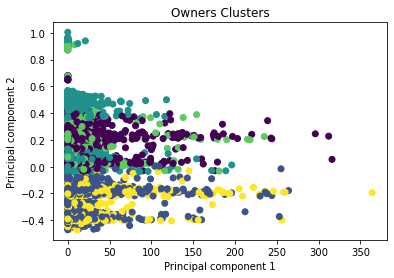

In [33]:
# Visualize the clusters
plt.scatter(x=clustered_df['countonlineaut'], y=clustered_df['PC 2'], c=clustered_df['Class'])
plt.xlabel('Principal component 1')
plt.ylabel('Principal component 2')
plt.title('Owners Clusters')
plt.show()

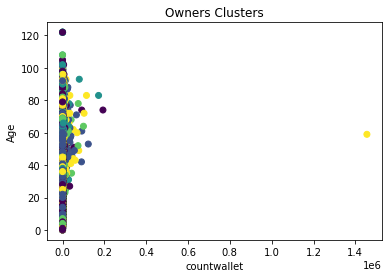

In [34]:
# Visualize the clusters
plt.scatter(x=clustered_df['sumatm'], y=clustered_df['age'], c=clustered_df['Class'])
plt.xlabel('countwallet')
plt.ylabel('Age')
plt.title('Owners Clusters')
plt.show()

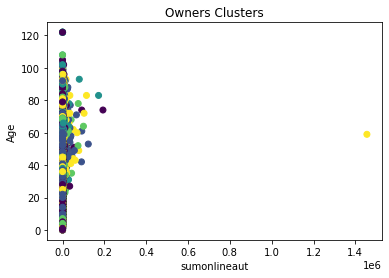

In [35]:
# Visualize the clusters
plt.scatter(x=clustered_df['sumatm'], y=clustered_df['age'], c=clustered_df['Class'])
plt.xlabel('sumonlineaut')
plt.ylabel('Age')
plt.title('Owners Clusters')
plt.show()

<AxesSubplot:title={'center':'sumonlineaut'}, xlabel='[Class]'>

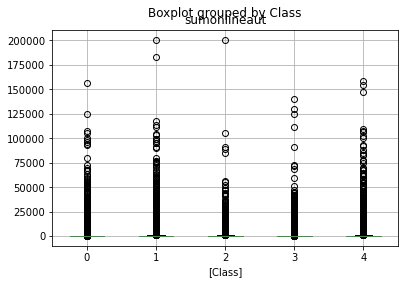

In [36]:
# Plot boxplots of the official time distributions by cluster
clustered_df.boxplot(['sumonlineaut'], by=['Class'])

In [37]:
clustered_df.to_csv('Owners Transactions_MinMax_PCA3_K5-Oline Only.csv')